In [1]:
import pickle
import matplotlib
import numpy as np
from skimage import exposure
from skimage.restoration import (denoise_wavelet, estimate_sigma)
from sklearn.preprocessing import normalize, minmax_scale
import matplotlib.pyplot as plt
%matplotlib inline


Bad key "text.kerning_factor" on line 4 in
/opt/conda/lib/python3.7/site-packages/matplotlib/mpl-data/stylelib/_classic_test_patch.mplstyle.
You probably need to get an updated matplotlibrc file from
https://github.com/matplotlib/matplotlib/blob/v3.1.3/matplotlibrc.template
or from the matplotlib source distribution


In [16]:
def post_process_matrix(sample_index, cut_sample=None, low_value=2, high_value=98, clip_limit=0.03, preprocess_orig='normalize'):
    sample = covMat[evalFileList[sample_index]]
    for i in range(len(sample)):   
        sample[i][i] = 0
        
    if cut_sample is not None:
        sample = sample[:cut_sample, :cut_sample]
    
    if preprocess_orig == 'normalize':
        sample = normalize(sample)
    elif preprocess_orig == 'maxmin':
        sample = minmax_scale(sample)
    elif preprocess_orig == 'denoising':
        sigma_est = estimate_sigma(sample, average_sigmas=False)
        sample = denoise_wavelet(sample, method='BayesShrink', mode='soft', rescale_sigma=True)
        sample = denoise_wavelet(sample, method='VisuShrink', mode='soft', sigma=sigma_est/4, rescale_sigma=False)
    
    print('orig', np.max(sample), np.min(sample))
    
    # scale with the designated lowest value and highest value. (best! with a high lowest threshold...)
    lowest, highest = np.percentile(sample, (low_value, high_value))
    
    sampleSced = exposure.rescale_intensity(sample, in_range=(lowest, highest))
    print(np.max(sampleSced), np.min(sampleSced))
    # equalize the histogram
    sampleEqed = exposure.equalize_hist(sample)

    # equalize then scale
    sampleEqSced = exposure.rescale_intensity(exposure.equalize_hist(sample), in_range=(lowest, highest))
    
    # scale then equalize
    sampleScEqed = exposure.equalize_hist(exposure.rescale_intensity(sample, in_range=(lowest, highest)))

    # adaptive histogram equalize
    sampleAdEqed = exposure.equalize_adapthist(normalize(sample), clip_limit=clip_limit)

    return (sample, sampleSced, sampleEqed, sampleScEqed, sampleEqSced, sampleAdEqed)

titles = ['Original', 'Scaled(Best)', 'Equalized', 'Scaled then Equalized', 'Equalized then Scaled', 'Normalized then Adaptive Equalized']

In [3]:
with open('./spks_tmpmatrix', 'rb') as f:
    covMat = pickle.load(f)

print('--> cov_matrix keys:')
print(*list(covMat.keys())[:4], sep='\t')
print('... with length of {} matrices.'.format(len(covMat.keys())))

evalFileList = list(covMat.keys())

--> cov_matrix keys:
DH_EVAL_0050.wav	DH_EVAL_0100.wav	DH_EVAL_0099.wav	DH_EVAL_0048.wav
... with length of 259 matrices.


In [30]:
startIndex = 0  # Test start index
batchSize = 5    # Test batch size
figSize = 3.5    # Figure size of each subplot
cutSample = 100  # Size of matrix
lowValue = 40    # Set a low value for range rescale
highValue = 95   # Set a high value for range rescale

 ** Unprocessed original matrix.
orig 0.88523316 -0.21203037
1.0 0.0
orig 0.80818623 -0.2831149
1.0 0.0
orig 0.882106 -0.18875782
1.0 0.0
orig 0.77073646 -0.23344484
0.99999994 0.0
orig 0.7954358 -0.27527776
1.0000001 0.0


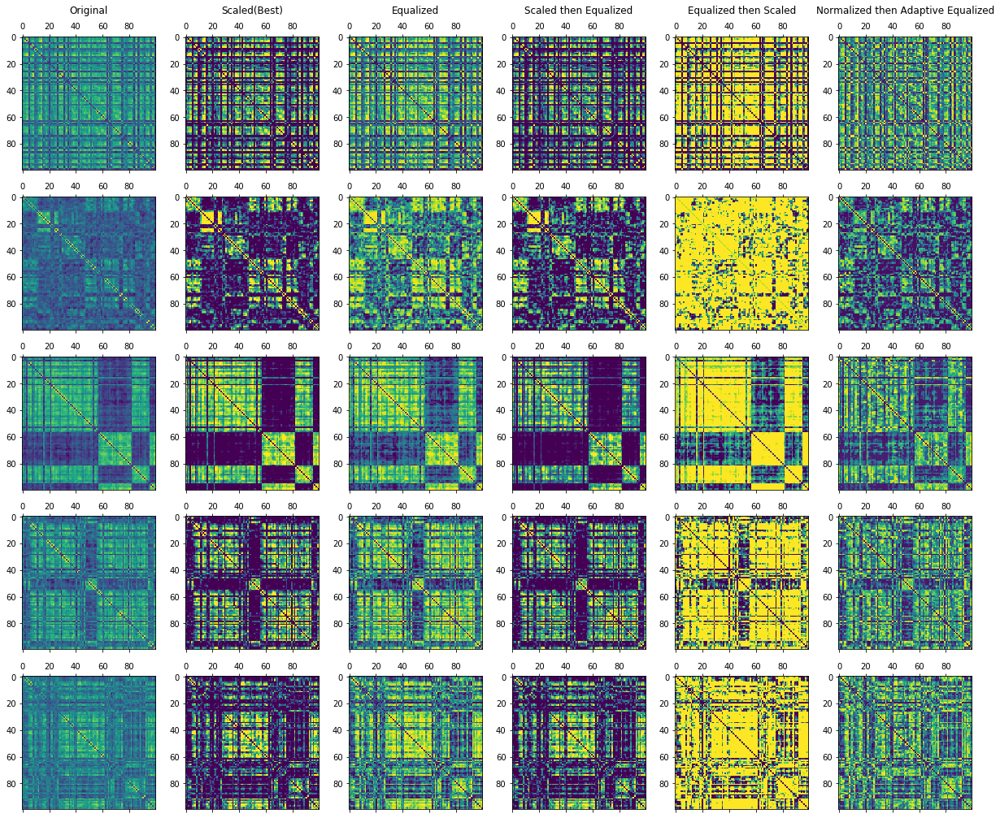

In [31]:
print(" ** Unprocessed original matrix.")
matfig, ax = plt.subplots(batchSize, len(titles), figsize=(figSize * len(titles), figSize * batchSize))
preprocess_orig = None
if batchSize != 1:
    for col, title in zip(ax[0], titles):
        col.set_title(title, pad=20)
    for i in range(startIndex, startIndex + batchSize):
        result = post_process_matrix(i, cutSample, lowValue, highValue, clip_limit=0.1, preprocess_orig=preprocess_orig)
        for k in range(len(titles)):
            ax[i - startIndex, k].matshow(result[k]);
else:
    for col, title in zip(ax, titles):
        col.set_title(title, pad=20)
    for i in range(startIndex, startIndex + batchSize):
        result = post_process_matrix(i, cutSample, lowValue, highValue, clip_limit=0.1, preprocess_orig=preprocess_orig)
        for k in range(len(titles)):
            ax[k].matshow(result[k]);

 ** Unprocessed original matrix.
orig 0.88523316 -0.27853847
1.0000001 0.0
orig 0.80818623 -0.2831149
1.0 0.0
orig 0.882106 -0.26007116
0.99999994 0.0
orig 0.8350942 -0.29901272
1.0000001 0.0
orig 0.8260216 -0.27527776
1.0 0.0


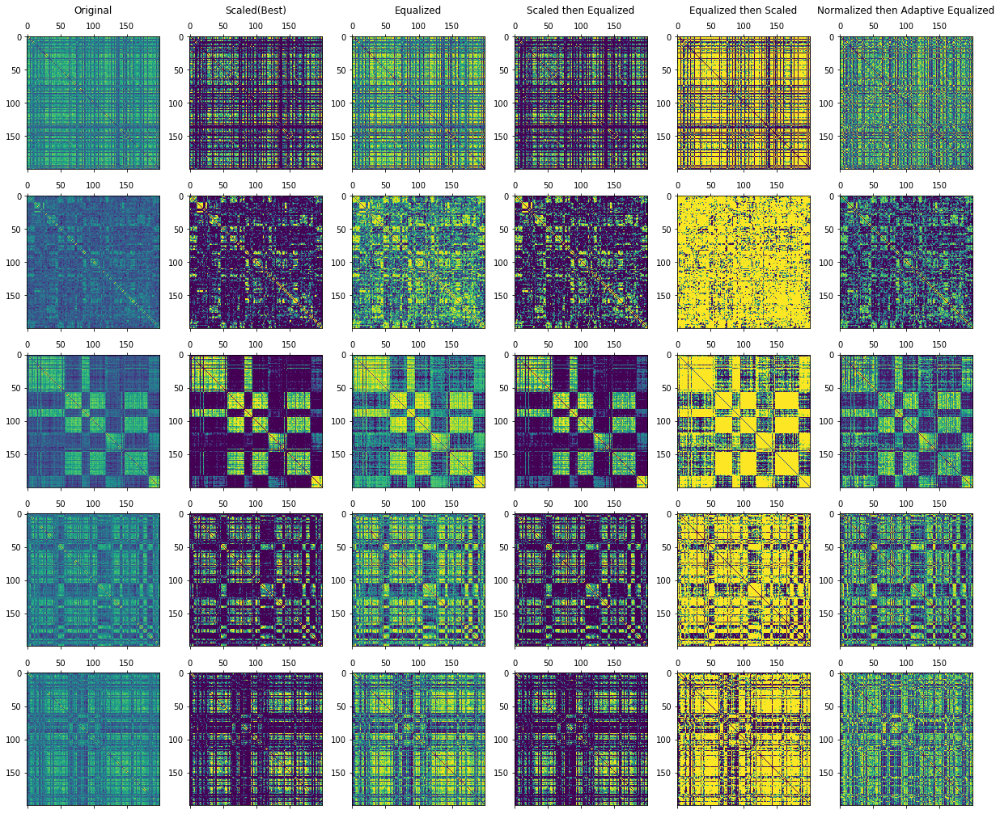

In [21]:
print(" ** Unprocessed original matrix.")
matfig, ax = plt.subplots(batchSize, len(titles), figsize=(figSize * len(titles), figSize * batchSize))
preprocess_orig = None
if batchSize != 1:
    for col, title in zip(ax[0], titles):
        col.set_title(title, pad=20)
    for i in range(startIndex, startIndex + batchSize):
        result = post_process_matrix(i, cutSample, lowValue, highValue, clip_limit=0.1, preprocess_orig=preprocess_orig)
        for k in range(len(titles)):
            ax[i - startIndex, k].matshow(result[k]);
else:
    for col, title in zip(ax, titles):
        col.set_title(title, pad=20)
    for i in range(startIndex, startIndex + batchSize):
        result = post_process_matrix(i, cutSample, lowValue, highValue, clip_limit=0.1, preprocess_orig=preprocess_orig)
        for k in range(len(titles)):
            ax[k].matshow(result[k]);

 ** Normalized original matrix.


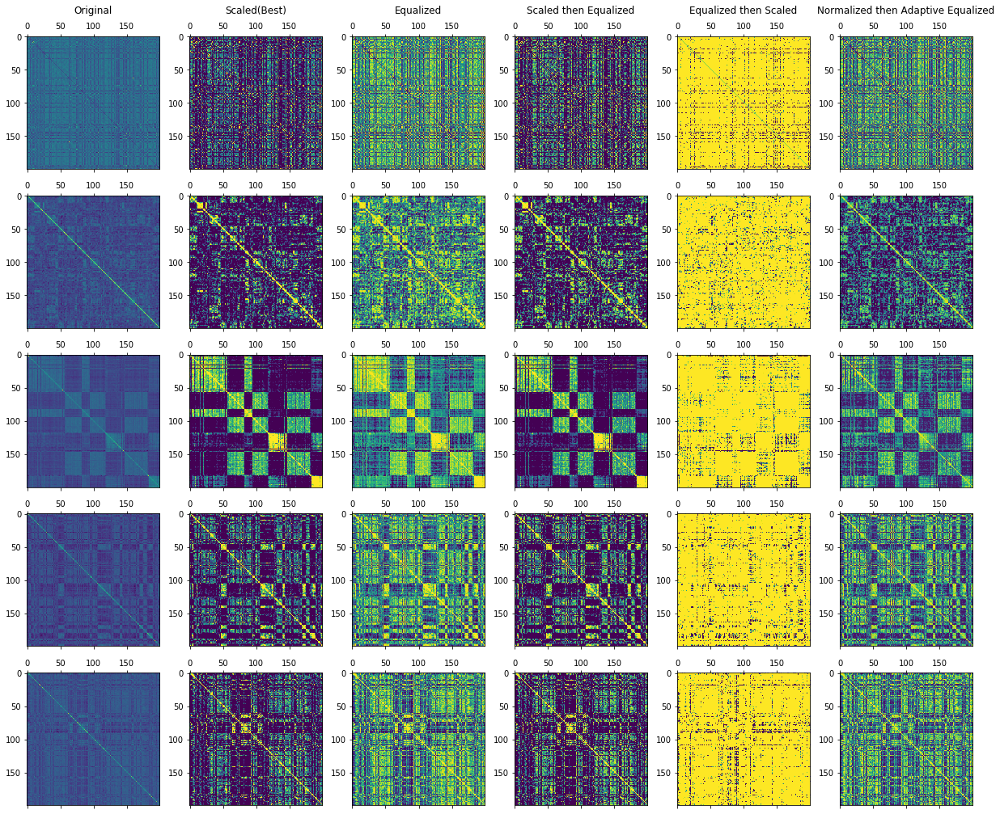

In [6]:
print(" ** Normalized original matrix.")
matfig, ax = plt.subplots(batchSize, len(titles), figsize=(figSize * len(titles), figSize * batchSize))
preprocess_orig = 'normalize'
if batchSize != 1:
    for col, title in zip(ax[0], titles):
        col.set_title(title, pad=20)
    for i in range(startIndex, startIndex + batchSize):
        result = post_process_matrix(i, cutSample, lowValue, highValue, clip_limit=0.1, preprocess_orig=preprocess_orig)
        for k in range(len(titles)):
            ax[i - startIndex, k].matshow(result[k]);
else:
    for col, title in zip(ax, titles):
        col.set_title(title, pad=20)
    for i in range(startIndex, startIndex + batchSize):
        result = post_process_matrix(i, cutSample, lowValue, highValue, clip_limit=0.1, preprocess_orig=preprocess_orig)
        for k in range(len(titles)):
            ax[k].matshow(result[k]);

 ** Minmax scaled original matrix.


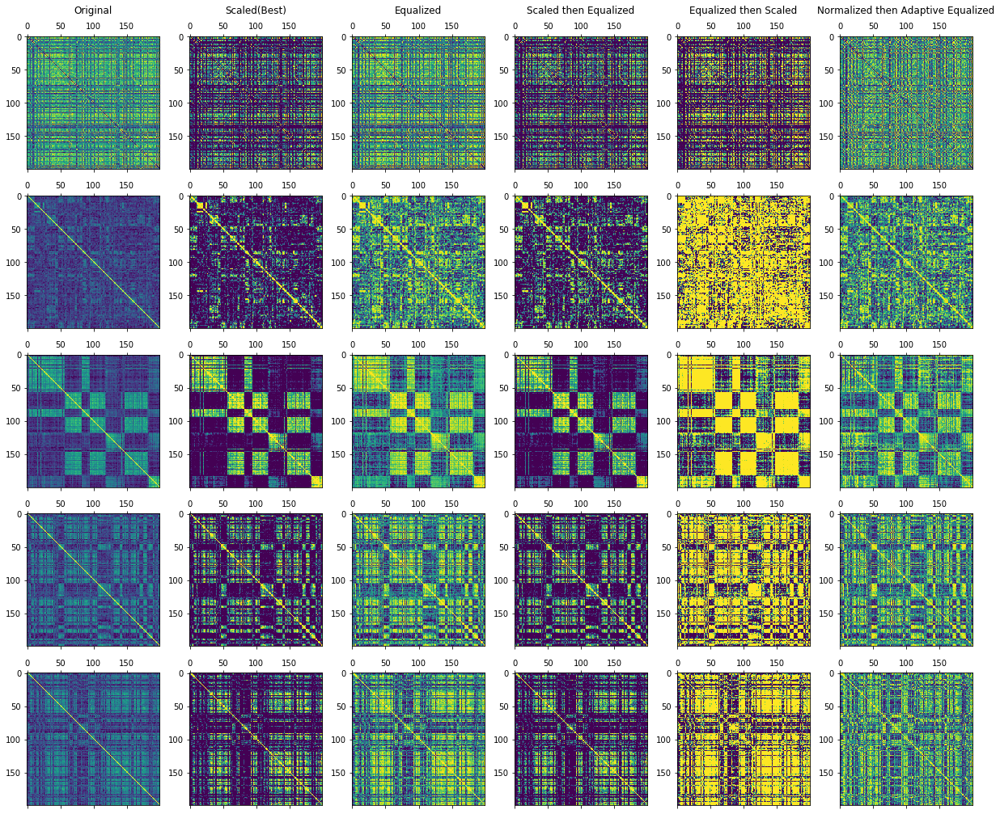

In [7]:
print(" ** Minmax scaled original matrix.")
matfig, ax = plt.subplots(batchSize, len(titles), figsize=(figSize * len(titles), figSize * batchSize))
preprocess_orig = 'maxmin'
if batchSize != 1:
    for col, title in zip(ax[0], titles):
        col.set_title(title, pad=20)
    for i in range(startIndex, startIndex + batchSize):
        result = post_process_matrix(i, cutSample, lowValue, highValue, clip_limit=0.1, preprocess_orig=preprocess_orig)
        for k in range(len(titles)):
            ax[i - startIndex, k].matshow(result[k]);
else:
    for col, title in zip(ax, titles):
        col.set_title(title, pad=20)
    for i in range(startIndex, startIndex + batchSize):
        result = post_process_matrix(i, cutSample, lowValue, highValue, clip_limit=0.1, preprocess_orig=preprocess_orig)
        for k in range(len(titles)):
            ax[k].matshow(result[k]);

 ** Wavelet denoised original matrix.
orig 0.68897843 -0.081566274
1.0 0.0
orig 0.7286161 -0.14259085
0.99999994 0.0
orig 0.83452356 -0.118939236
1.0 0.0
orig 0.69478464 -0.1461762
1.0 0.0
orig 0.70405865 -0.128227
0.99999994 0.0


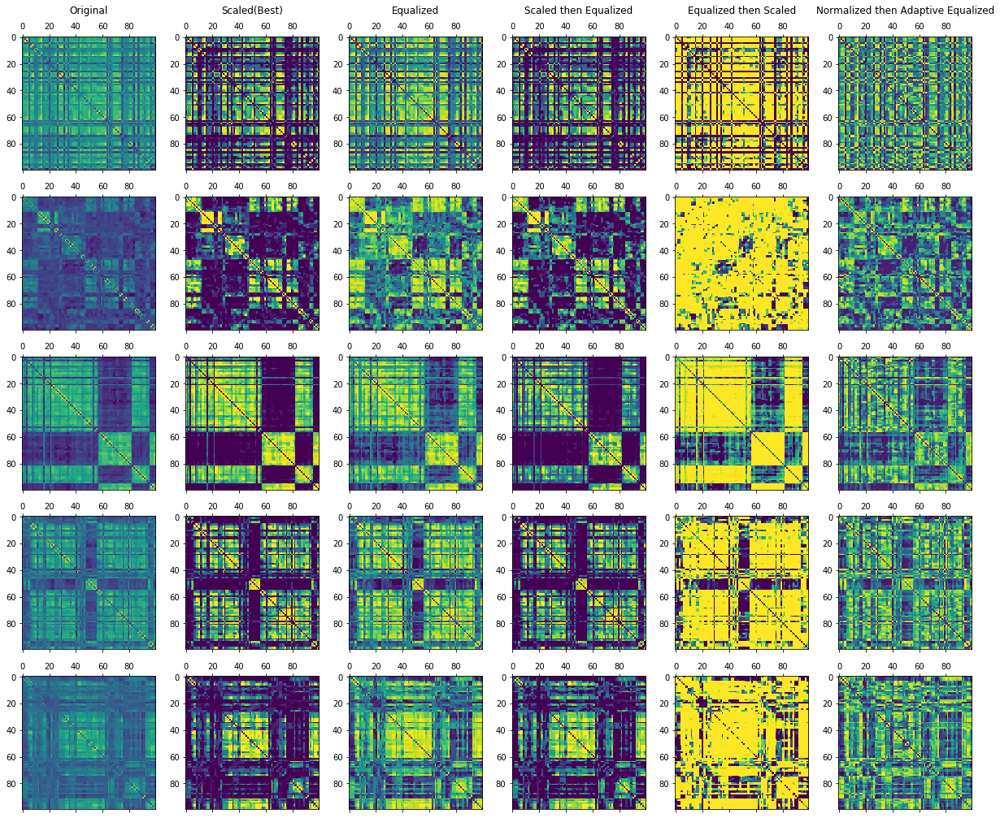

In [32]:
print(" ** Wavelet denoised original matrix.")
matfig, ax = plt.subplots(batchSize, len(titles), figsize=(figSize * len(titles), figSize * batchSize))
preprocess_orig = 'denoising'
if batchSize != 1:
    for col, title in zip(ax[0], titles):
        col.set_title(title, pad=20)
    for i in range(startIndex, startIndex + batchSize):
        result = post_process_matrix(i, cutSample, lowValue, highValue, clip_limit=0.1, preprocess_orig=preprocess_orig)
        for k in range(len(titles)):
            ax[i - startIndex, k].matshow(result[k]);
else:
    for col, title in zip(ax, titles):
        col.set_title(title, pad=20)
    for i in range(startIndex, startIndex + batchSize):
        result = post_process_matrix(i, cutSample, lowValue, highValue, clip_limit=0.1, preprocess_orig=preprocess_orig)
        for k in range(len(titles)):
            ax[k].matshow(result[k]);

 ** Wavelet denoised original matrix.


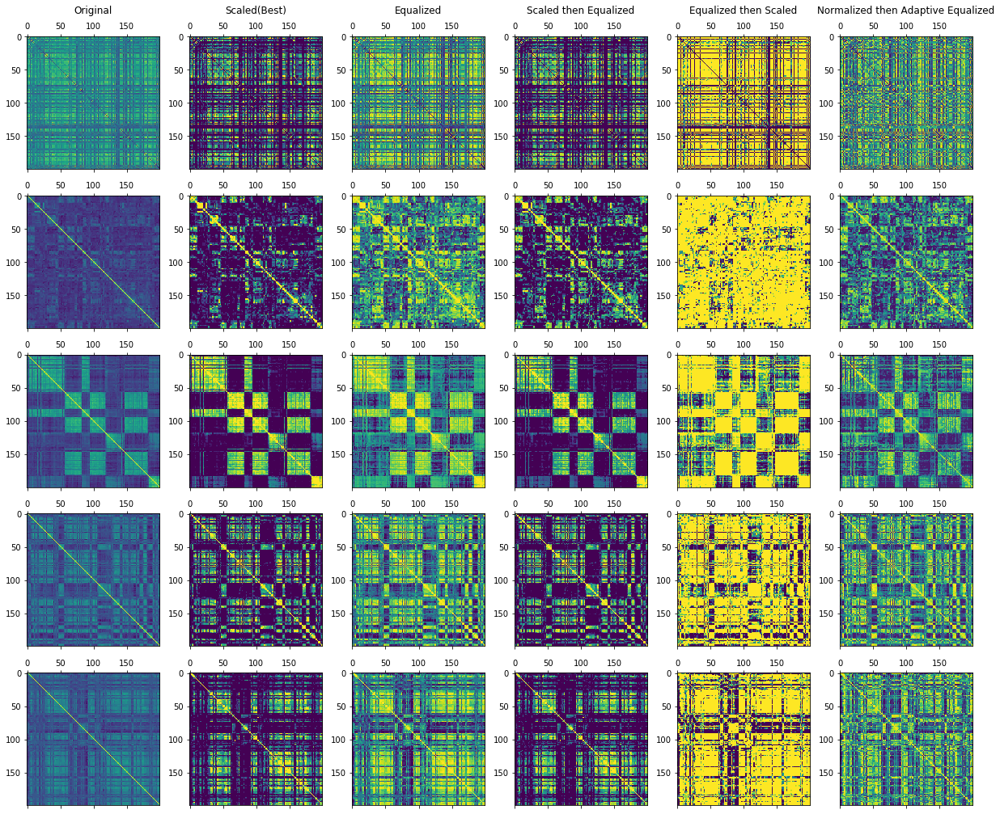

In [8]:
print(" ** Wavelet denoised original matrix.")
matfig, ax = plt.subplots(batchSize, len(titles), figsize=(figSize * len(titles), figSize * batchSize))
preprocess_orig = 'denoising'
if batchSize != 1:
    for col, title in zip(ax[0], titles):
        col.set_title(title, pad=20)
    for i in range(startIndex, startIndex + batchSize):
        result = post_process_matrix(i, cutSample, lowValue, highValue, clip_limit=0.1, preprocess_orig=preprocess_orig)
        for k in range(len(titles)):
            ax[i - startIndex, k].matshow(result[k]);
else:
    for col, title in zip(ax, titles):
        col.set_title(title, pad=20)
    for i in range(startIndex, startIndex + batchSize):
        result = post_process_matrix(i, cutSample, lowValue, highValue, clip_limit=0.1, preprocess_orig=preprocess_orig)
        for k in range(len(titles)):
            ax[k].matshow(result[k]);